### 必要ライブラリのインポート
#### ＜注意事項＞pydubのラッパーであるppmpegのインストールが必要

In [1]:
import numpy as np 
import pandas as pd
import os
from glob import glob
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#音声系のライブラリ
import wave
import pydub
import librosa
import librosa.display

### 周波数の可視化

In [2]:
sample_file=glob('sample_data/*mp3')

In [3]:
wav,sr=librosa.core.load(sample_file[0])

/Users/sanchez/opt/anaconda3/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


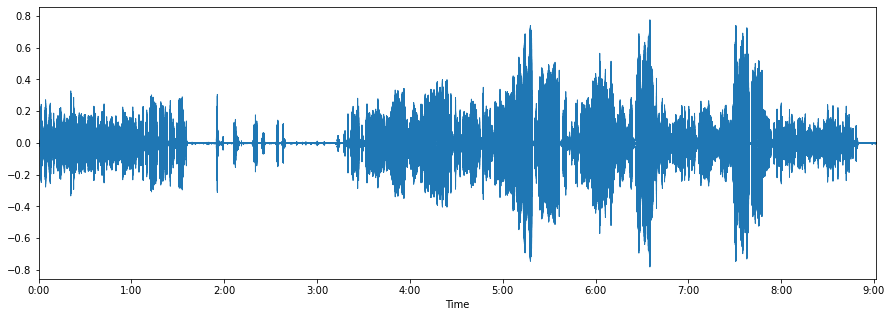

In [4]:
fig,ax=plt.subplots(figsize=(15,5))
librosa.display.waveplot(wav,sr)

In [5]:
wav.shape

(11929227,)

In [6]:
sound=pydub.AudioSegment.from_mp3(sample_file[0])

In [6]:
sound

### 動画を時間で切り分けるための関数（ミックスボイスが出ている部分だけを抽出したい用）

In [7]:
#split_soundフォルダ配下に保存
def split_sound(path,start_m,start_s,finish_m,finish_s,save_dir='./sample_data/split_sound/'):
    sound=pydub.AudioSegment.from_mp3(path)
    sound_split=sound[(start_m*60000+start_s*1000):(finish_m*60000+finish_s*1000)]
    
    save_file=path.split('/')[-1].split('.')[0]+'_split.mp3'
    save_path=os.path.join(save_dir,save_file)
    
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    sound_split.export(save_path,format='mp3')
    return sound_split

In [8]:
sample=split_sound(sample_file[0],3,31,4,24)

In [9]:
sample

### splitter.aiでボーカルの声だけ抽出した音声をメル周波数可視化

In [28]:
sample=glob('sample_data/split_sound/*mp3')
wav,sr=librosa.core.load(sample[1])

/Users/sanchez/opt/anaconda3/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

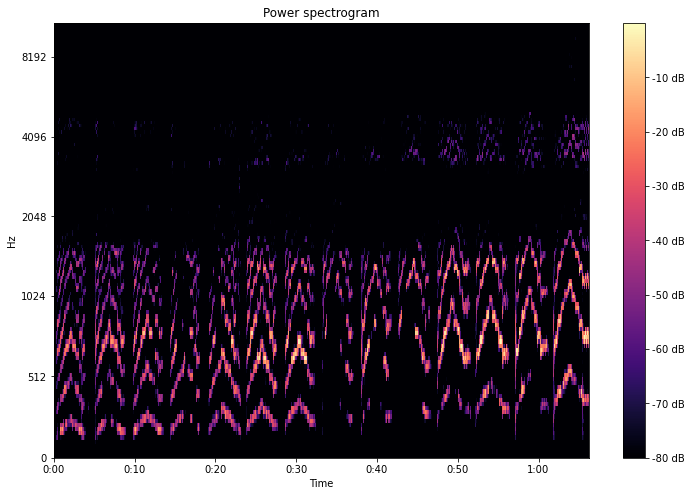

In [33]:
S = librosa.feature.melspectrogram(wav, sr=sr, n_mels=128,hop_length=2048,n_fft=2048,fmax=8192)
log_S = librosa.amplitude_to_db(S, ref=np.max)

plt.figure(figsize=(12,8))
librosa.display.specshow(log_S, sr=4410,x_axis='time',y_axis='mel')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout

### 音声抽出せずに元の音源をメル周波数で可視化

In [34]:
sound=pydub.AudioSegment.from_mp3('./sample_data/sample.mp3')

In [37]:
sample=split_sound('./sample_data/sample.mp3',3,31,4,24)

In [39]:
original_path=glob('./sample_data/split_sound/*.mp3')[0]

In [42]:
wav,sr=librosa.core.load(original_path,sr=44100)

/Users/sanchez/opt/anaconda3/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

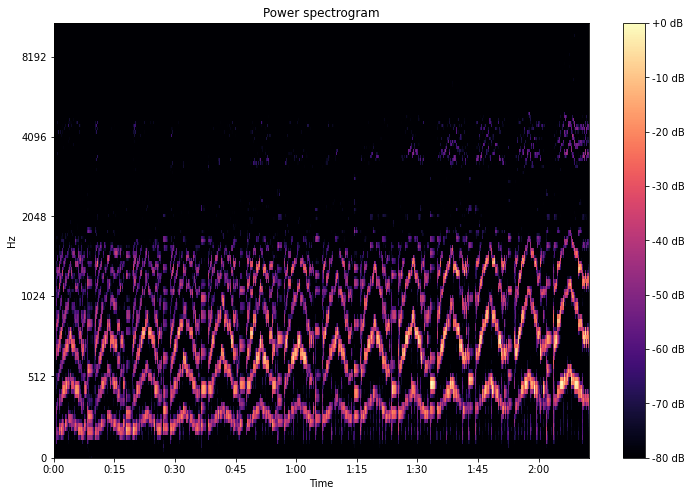

In [43]:
S = librosa.feature.melspectrogram(wav, sr=sr, n_mels=128,hop_length=2048,n_fft=2048,fmax=8192)
log_S = librosa.amplitude_to_db(S, ref=np.max)

plt.figure(figsize=(12,8))
librosa.display.specshow(log_S, sr=4410,x_axis='time',y_axis='mel')
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout

/Users/sanchez/opt/anaconda3/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


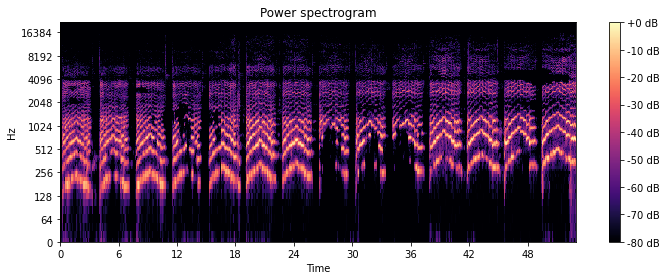

In [31]:
sr=44100
music,sr_=librosa.load(sample[0],sr=sr)
D=np.abs(librosa.stft(music))       #短時間フーリエ変換,n_fft(窓関数のサイズ),win_length=n_fft,hop_length=n_fft/4(スライドさせる幅)
plt.figure(figsize=(10,4))
librosa.display.specshow(librosa.amplitude_to_db(D,ref=np.max),y_axis='log',x_axis='time',sr=sr)  #振幅を音圧に変換している
plt.title('Power spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()

In [ ]:
sound = pydub.AudioSegment.from_wav("input.wav")
sound.export("output.mp3", format="mp3")

### スプレッドシートの読み込み
#### ミックスボイスYoutube音源のスプレッドシートをCSV形式で同じ階層にダウンロード

In [11]:
df=pd.read_csv('ミックスボイスYoutube音源抽出 - シート1.csv').drop('Unnamed: 8',axis=1)
df=df.iloc[2:,:].reset_index(drop=True)
df.head()

,No,URL,youtuberの名前,drive内でのファイル名,mixvoiceの開始（分）,mixvoiceの開始（秒）,mixvoiceの終わり（分）,mixvoiceの終わり（秒）,比較された声の開始（分）,比較された声の開始（秒）,比較された声の終わり（分）,比較された声の終わり（秒）
0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
df.columns

Index(['No', 'URL', 'youtuberの名前', ' drive内でのファイル名', 'mixvoiceの開始（分）',
       'mixvoiceの開始（秒）', 'mixvoiceの終わり（分）', 'mixvoiceの終わり（秒）', '比較された声の開始（分）',
       '比較された声の開始（秒）', '比較された声の終わり（分）', '比較された声の終わり（秒）'],
      dtype='object')

## [必要事項]
### ・sample_data/original_soundフォルダはなければ作成
### ・Driveのファイル名のままsample_data/original_soundフォルダにダウンロード

In [ ]:
# スプレッドシートからミックスボイスの部分のみを抽出しsample_data/split_sound配下に保存する
for idx,row in df.iterrows():
    start_m=row['mixvoiceの開始（分）']
    start_s=row['mixvoiceの開始（秒）']
    finish_m=row['mixvoiceの終わり（分）']
    finish_s=row['mixvoiceの終わり（秒）']
    path='sample_data/original_sound/{}'.format(row[' drive内でのファイル名'])
    save_dir='./sample_data/split_sound/{}'.format(row[ 'youtuberの名前'])
    split_sound(path,start_m,start_s,finish_m,finish_s,save_dir='./sample_data/split_sound/')